In [2]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
%matplotlib inline
import os
import pylab
import numpy as np
import umap
import glob


In [3]:
sns.set(context='paper', style='darkgrid', rc={'figure.facecolor':'white'}, font_scale=2)

In [11]:
os.chdir('/Users/s1249052/PhD/flow data/vac69a/t cells only/experiment_210618_files/csv_by_person/02')
os.getcwd()
filenames = glob.glob('*.csv')
filenames


['14c01_sample1_01_0_0_T_cells.csv',
 '14c02_sample1_01_0_0_T_cells.csv',
 '14c03_sample1_01_0_0_T_cells.csv',
 '14c04_sample1_01_0_0_T_cells.csv',
 '14c05_sample1_01_0_0_T_cells.csv']

In [54]:
Baseline = pd.read_csv(filenames[0])
C_10 = pd.read_csv(filenames[1])
C_12 = pd.read_csv(filenames[2])
DoD = pd.read_csv(filenames[3])
T_6 = pd.read_csv(filenames[4])

Baseline = Baseline.apply(np.arcsinh, 'columns')
C_10 = C_10.apply(np.arcsinh, 'columns')
C_12 = C_12.apply(np.arcsinh, 'columns')
DoD = DoD.apply(np.arcsinh, 'columns')
T_6 = T_6.apply(np.arcsinh, 'columns')


In [55]:
Baseline['Timepoint'] = 'C-1'
C_10['Timepoint'] = 'C+10'
C_12['Timepoint'] = 'C+12'
DoD['Timepoint'] = 'DoD'
T_6['Timepoint'] = 'T+6'


In [56]:
concat = Baseline.append([C_10, C_12, DoD, T_6], ignore_index=True, sort=False)

In [78]:
#print(len(Baseline)+len(C_10)+len(C_12)+len(DoD)+len(T_6))
#print(len(concat))
#print(len(concat.columns))
#print(concat.columns)
#print(len(sub_concat.columns))
sub_concat.iloc[:, 1:34]

,141Pr_HLA-DR,142Nd_BCL-2,143Nd_CD45RA,144Nd_GZB,145Nd_CD4,146Nd_Vd2,148Nd_ICOS,149Sm_CXCR5,150Nd_CD95,151Eu_CD103,...,168Er_CD127,169Tm_CD38,171Yb_CD49d,172Yb_CD25,173Yb_CD39,174Yb_CLA,175Lu_Perforin,198Pt_CD8,209Bi_CD16,Timepoint
0,0.000000,4.687225,3.931365,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,...,4.078405,3.126917,3.486562,1.887629,1.316506,2.603347,1.417754,4.724484,0.000000,C-1
1,0.000000,3.584899,3.505189,0.896894,5.450490,2.468887,1.956988,0.000000,0.909380,0.0,...,3.855416,5.087446,2.033088,0.870406,0.000000,0.279724,0.000000,0.697346,0.464288,C-1
2,0.159583,4.240899,0.000000,0.000000,0.574285,0.000000,0.000000,0.000000,3.566472,0.0,...,5.064615,2.772294,3.660964,2.190205,0.953640,1.496882,4.436971,4.197494,0.000000,C-1
3,0.314058,5.029791,3.775241,0.000000,0.000000,0.000000,0.000000,0.923096,0.470137,0.0,...,3.142208,3.463254,3.054099,1.068137,0.000000,1.207470,1.997173,5.144057,0.827061,C-1
4,0.000000,4.146923,3.147939,0.433663,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,...,3.415740,2.092585,2.641637,0.590385,1.352888,0.000000,1.348874,4.736860,0.022771,C-1


In [80]:
sub_concat = concat[["In115Di","Pr141Di", "Nd142Di", "Nd143Di", "Nd144Di", "Nd145Di", "Nd146Di", "Nd148Di", "Sm149Di", "Nd150Di", "Eu151Di", "Eu153Di", "Sm154Di", "Gd155Di", "Gd156Di", "Gd158Di",
    "Tb159Di", "Gd160Di", "Dy161Di", "Dy162Di", "Dy163Di", "Dy164Di", "Ho165Di", "Er166Di", "Er167Di", "Er168Di",
    "Tm169Di", "Yb171Di", "Yb172Di", "Yb173Di", "Yb174Di", "Lu175Di", "Pt198Di", "Bi209Di", 'Timepoint']].copy()
sub_concat.columns = ['115In_CD57', '141Pr_HLA-DR', '142Nd_BCL-2', '143Nd_CD45RA', '144Nd_GZB', '145Nd_CD4', '146Nd_Vd2',
    '148Nd_ICOS', '149Sm_CXCR5', '150Nd_CD95', '151Eu_CD103', '153Eu_Va7.2', '154Sm_TIM-3', '155Gd_PD1',
    '156Gd_CD161', '158Gd_CD27', '159Tb_FoxP3', '160Gd_CTLA4', '161Dy_Tbet', '162Dy_IntegrinB7', '163Dy_CD28', '164Dy_Ki-67',
    '165Ho_CD45RO', '166Er_CD56', '167Er_CCR7', '168Er_CD127', '169Tm_CD38', '171Yb_CD49d', '172Yb_CD25', '173Yb_CD39',
    '174Yb_CLA', '175Lu_Perforin', '198Pt_CD8', '209Bi_CD16', 'Timepoint']


  
    
    


/Users/s1249052/anaconda3/lib/python3.6/site-packages/umap/spectral.py:229: UserWarning: Embedding 2 connected components using meta-embedding (experimental)
  n_components


CPU times: user 4min 31s, sys: 11.9 s, total: 4min 43s
Wall time: 4min 1s


In [84]:
reducer = umap.UMAP(n_neighbors=20, min_dist=0.1, n_components=2, metric='euclidean')
%time embedding = reducer.fit_transform(sub_concat.iloc[:, 1:34])
embedding.shape 
sub_concat['umap1'] = embedding[:, 0]
sub_concat['umap2'] = embedding[:,1]

channels=list(sub_concat.columns.values)



/Users/s1249052/anaconda3/lib/python3.6/site-packages/umap/spectral.py:229: UserWarning: Embedding 2 connected components using meta-embedding (experimental)
  n_components


CPU times: user 3min 48s, sys: 11.9 s, total: 4min
Wall time: 3min 20s


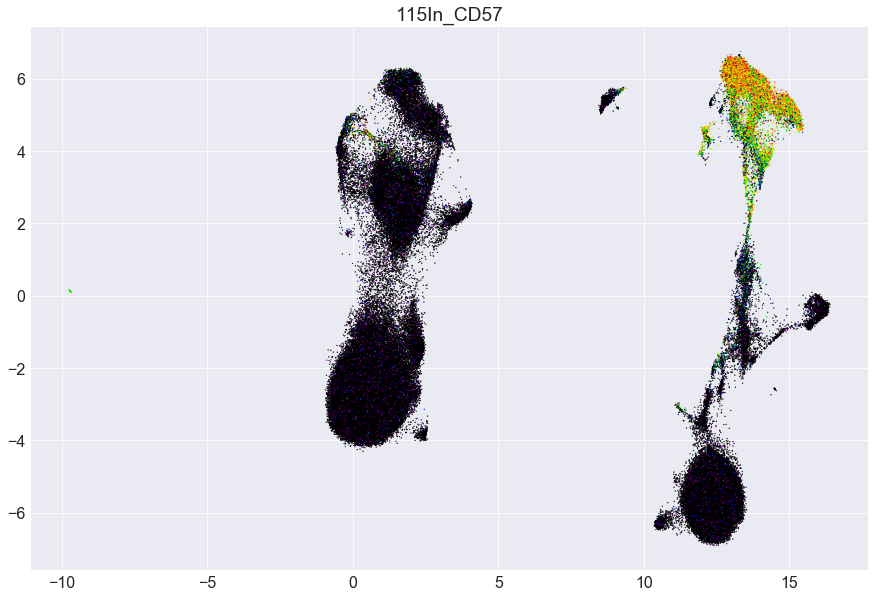

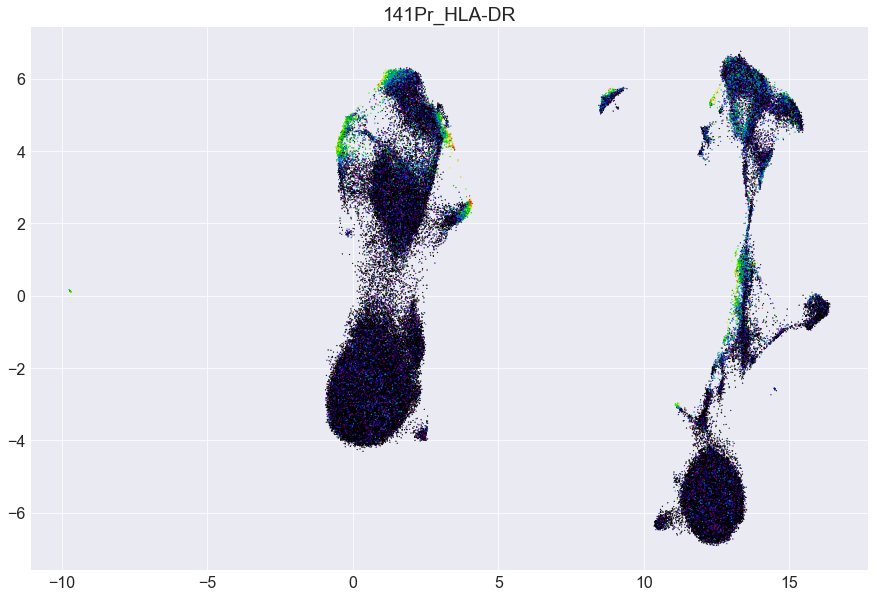

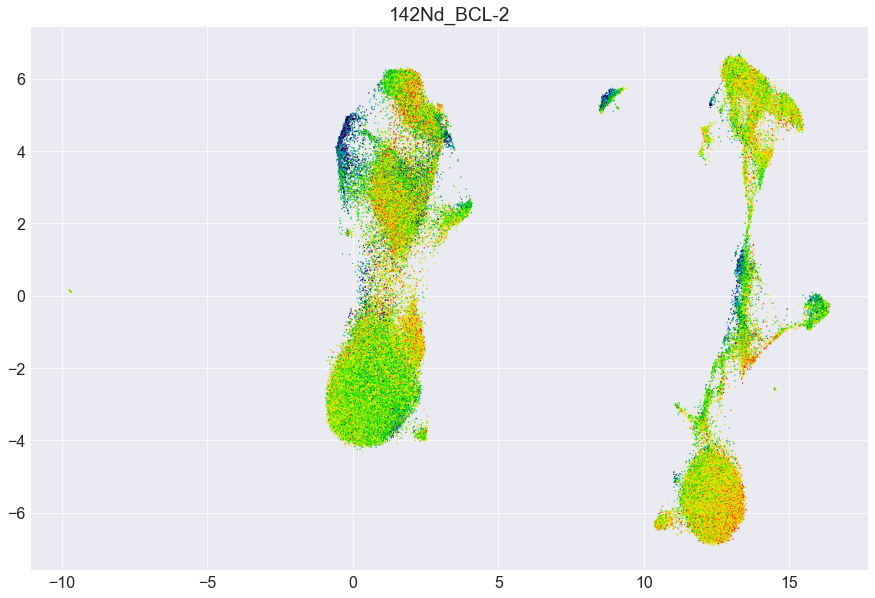

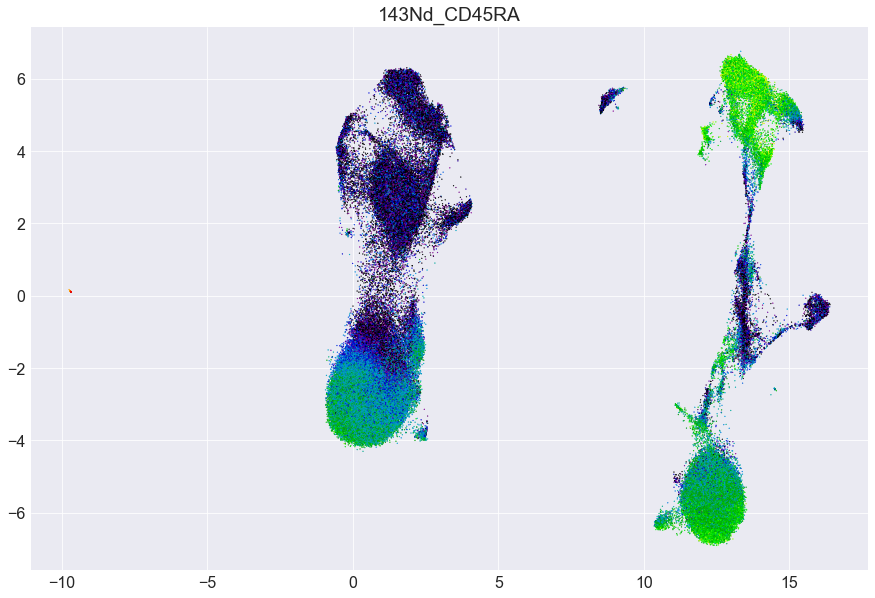

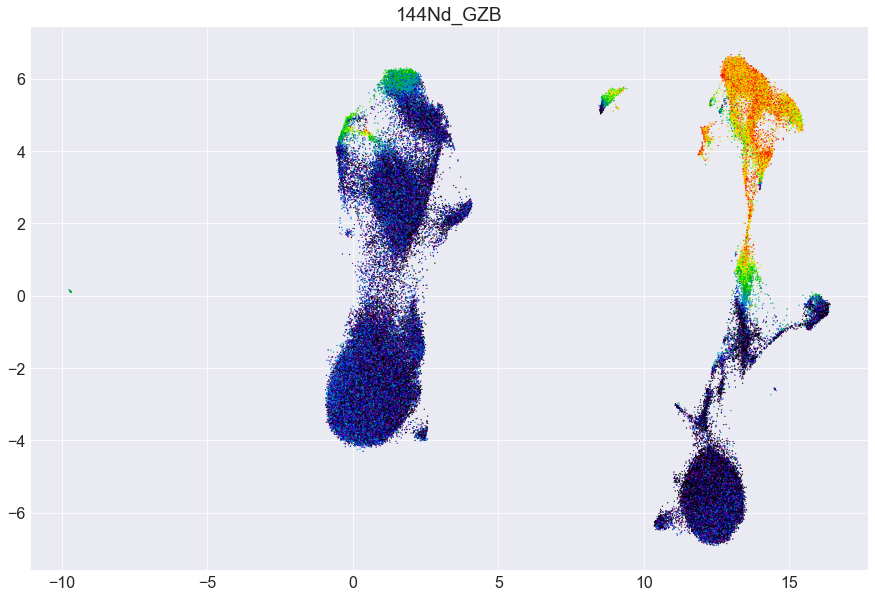

...

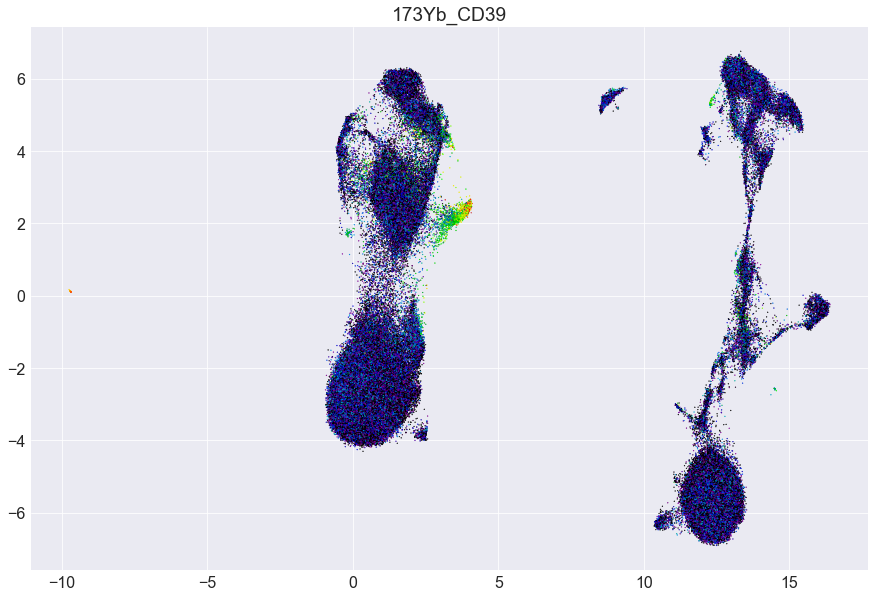

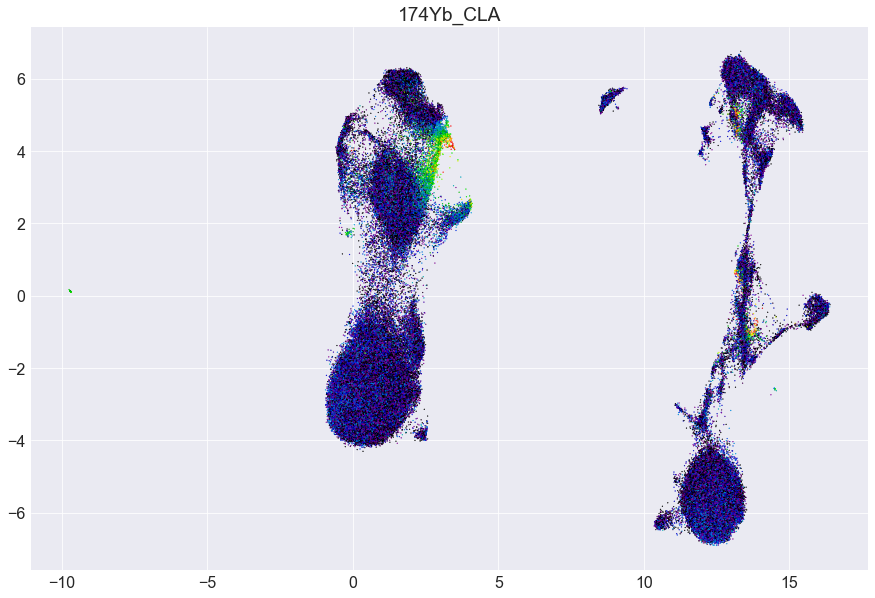

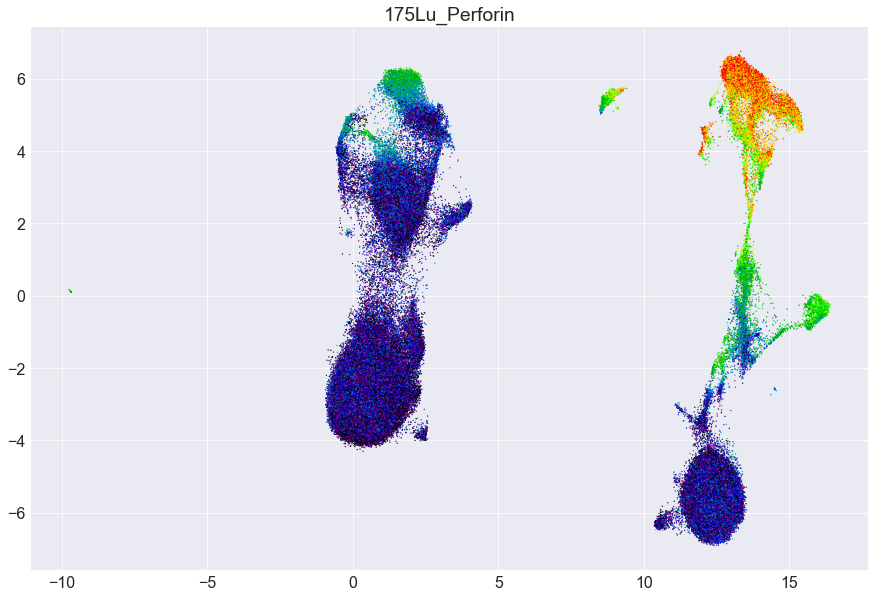

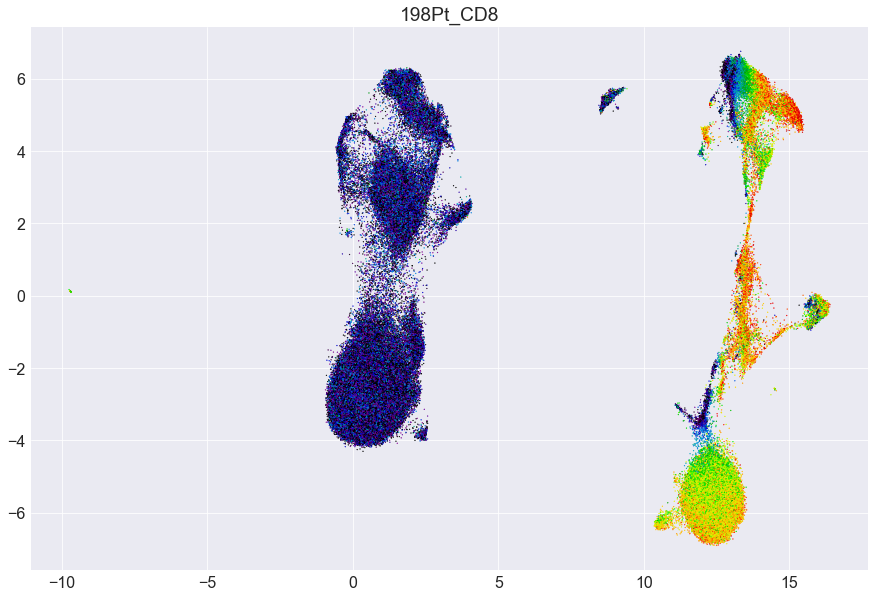

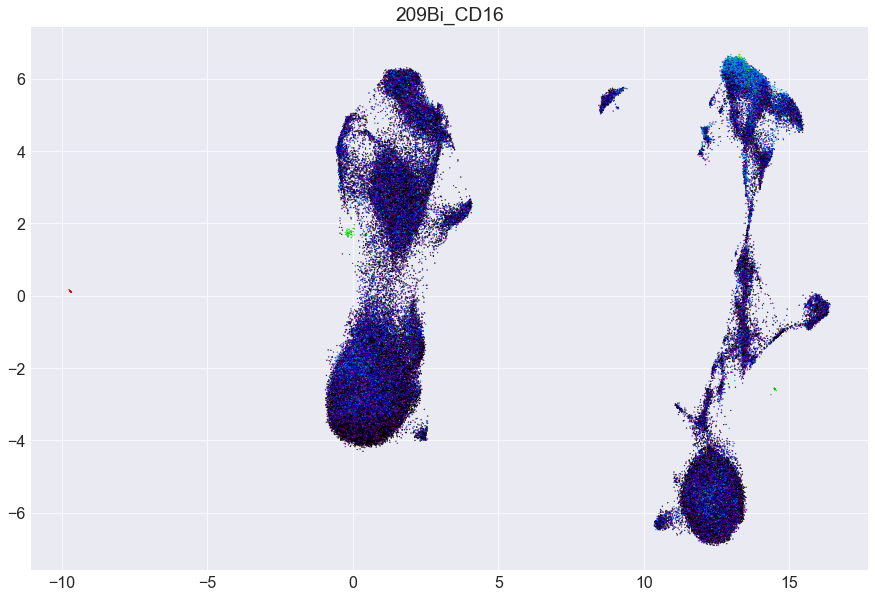

In [91]:
channels=list(sub_concat.columns.values)

for n in channels[0:34]:
    cmap=plt.get_cmap('nipy_spectral')
    fig=plt.figure(figsize=(15,10))
    ax=plt.subplot()
    ax.scatter(sub_concat['umap1'], sub_concat['umap2'],c=sub_concat[n], cmap=cmap, s=1)
    plt.title('{}'.format(n))
    #plt.savefig('{}.pdf'.format(n))
    plt.show()

In [101]:
Baseline_csv = sub_concat[sub_concat['Timepoint'] == 'C-1']
C_10_csv = sub_concat[sub_concat['Timepoint'] == 'C+10']
C_12_csv = sub_concat[sub_concat['Timepoint'] == 'C+12']
DoD_csv = sub_concat[sub_concat['Timepoint'] == 'DoD']
T_6_csv = sub_concat[sub_concat['Timepoint'] == 'T+6']


In [ ]:
Baseline_csv.to_csv('baseline_02_UMAP.csv', sep=',') 
C_10_csv.to_csv('C+10_02_UMAP.csv', sep=',') 
C_12_csv.to_csv('C+12_02_UMAP.csv', sep=',') 
DoD_csv.to_csv('DoD_02_UMAP.csv', sep=',') 
T_6_csv.to_csv('T+6_02_UMAP.csv', sep=',') 


In [ ]:
cytobank.to_csv('timecourse_02.csv', sep=',') 

In [24]:
#cytobank=flow_data[["Cd114Di", "In115Di","Pr141Di", "Nd142Di", "Nd143Di", "Nd144Di", "Nd145Di", "Nd146Di", "Sm147Di", "Nd148Di", "Sm149Di", "Nd150Di", "Eu151Di", "Eu153Di", "Sm154Di", "Gd155Di", "Gd156Di", "Gd158Di",
"Tb159Di", "Gd160Di", "Dy161Di", "Dy162Di", "Dy163Di", "Dy164Di", "Ho165Di", "Er166Di", "Er167Di", "Er168Di",
"Tm169Di", "Yb171Di", "Yb172Di", "Yb173Di", "Yb174Di", "Lu175Di", "Yb176Di", "Pt198Di", "Bi209Di"]].copy()

#cytobank.columns = ['114Cd_CD14', '115In_CD57', '141Pr_HLA-DR', '142Nd_BCL-2', '143Nd_CD45RA', '144Nd_GZB', '145Nd_CD4', '146Nd_Vd2',
'147Sm_CD20', '148Nd_ICOS', '149Sm_CXCR5', '150Nd_CD95', '151Eu_CD103', '153Eu_Va7.2', '154Sm_TIM-3', '155Gd_PD1',
'156Gd_CD161', '158Gd_CD27', '159Tb_FoxP3', '160Gd_CTLA4', '161Dy_Tbet', '162Dy_IntegrinB7', '163Dy_CD28', '164Dy_Ki-67',
'165Ho_CD45RO', '166Er_CD56', '167Er_CCR7', '168Er_CD127', '169Tm_CD38', '171Yb_CD49d', '172Yb_CD25', '173Yb_CD39',
'174Yb_CLA', '175Lu_Perforin', '176Yb_CX3CR1', '198Pt_CD8', '209Bi_CD16']

In [38]:
#copy with the channels that worked/are interesting

cytobank=flow_data[["In115Di","Pr141Di", "Nd142Di", "Nd143Di", "Nd144Di", "Nd145Di", "Nd146Di", "Nd148Di", "Sm149Di", "Nd150Di", "Eu151Di", "Eu153Di", "Sm154Di", "Gd155Di", "Gd156Di", "Gd158Di",
"Tb159Di", "Gd160Di", "Dy161Di", "Dy162Di", "Dy163Di", "Dy164Di", "Ho165Di", "Er166Di", "Er167Di", "Er168Di",
"Tm169Di", "Yb171Di", "Yb172Di", "Yb173Di", "Yb174Di", "Lu175Di", "Pt198Di", "Bi209Di"]].copy()

cytobank.columns = ['115In_CD57', '141Pr_HLA-DR', '142Nd_BCL-2', '143Nd_CD45RA', '144Nd_GZB', '145Nd_CD4', '146Nd_Vd2',
'148Nd_ICOS', '149Sm_CXCR5', '150Nd_CD95', '151Eu_CD103', '153Eu_Va7.2', '154Sm_TIM-3', '155Gd_PD1',
'156Gd_CD161', '158Gd_CD27', '159Tb_FoxP3', '160Gd_CTLA4', '161Dy_Tbet', '162Dy_IntegrinB7', '163Dy_CD28', '164Dy_Ki-67',
'165Ho_CD45RO', '166Er_CD56', '167Er_CCR7', '168Er_CD127', '169Tm_CD38', '171Yb_CD49d', '172Yb_CD25', '173Yb_CD39',
'174Yb_CLA', '175Lu_Perforin', '198Pt_CD8', '209Bi_CD16']

In [39]:
len(cytobank.columns)

34

In [41]:
cytobank=cytobank.apply(np.arcsinh, 'columns')

reducer = umap.UMAP(n_neighbors=30, min_dist=0.01, n_components=2, metric='euclidean')

%time embedding = reducer.fit_transform(cytobank)
embedding.shape  

CPU times: user 41.1 s, sys: 2.42 s, total: 43.5 s
Wall time: 41 s


(27003, 2)

In [42]:
cytobank['umap1'] = embedding[:, 0]
cytobank['umap2'] = embedding[:,1]

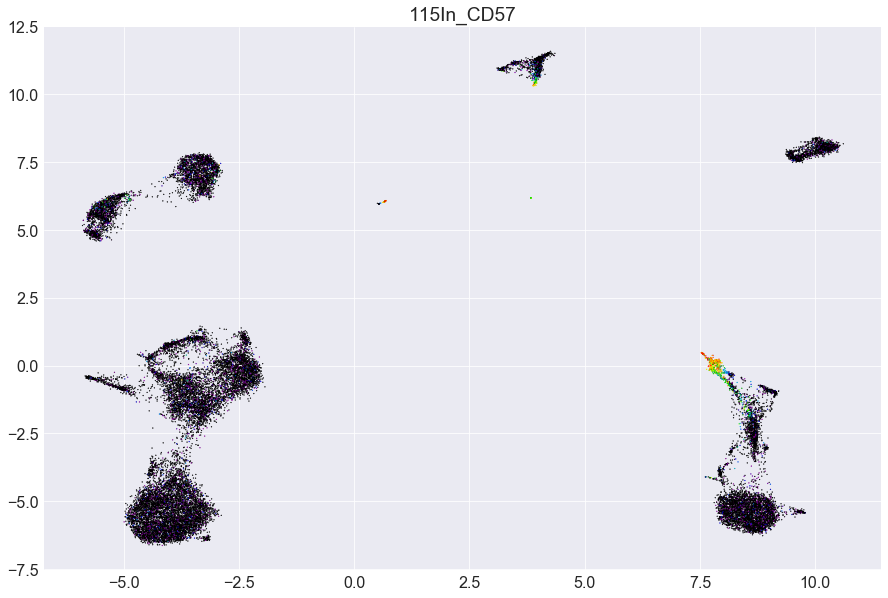

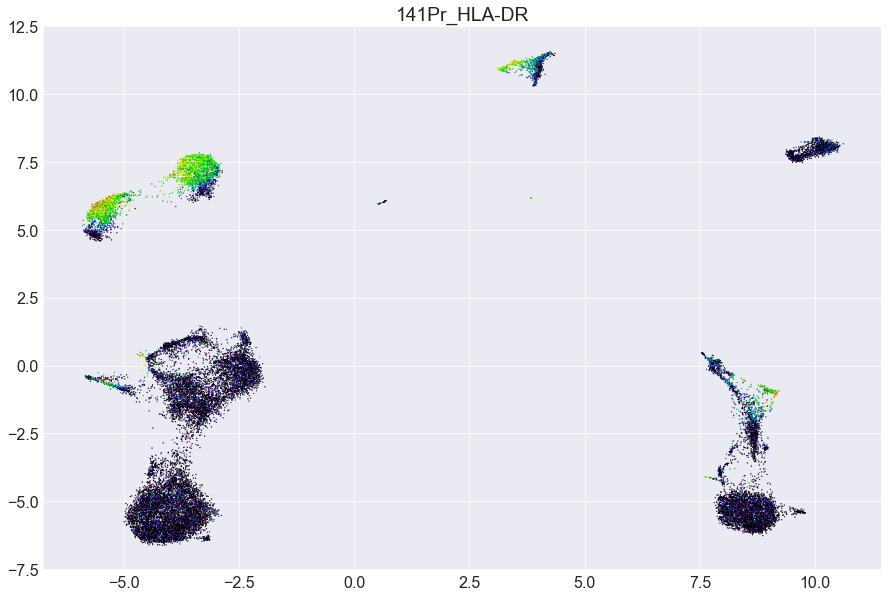

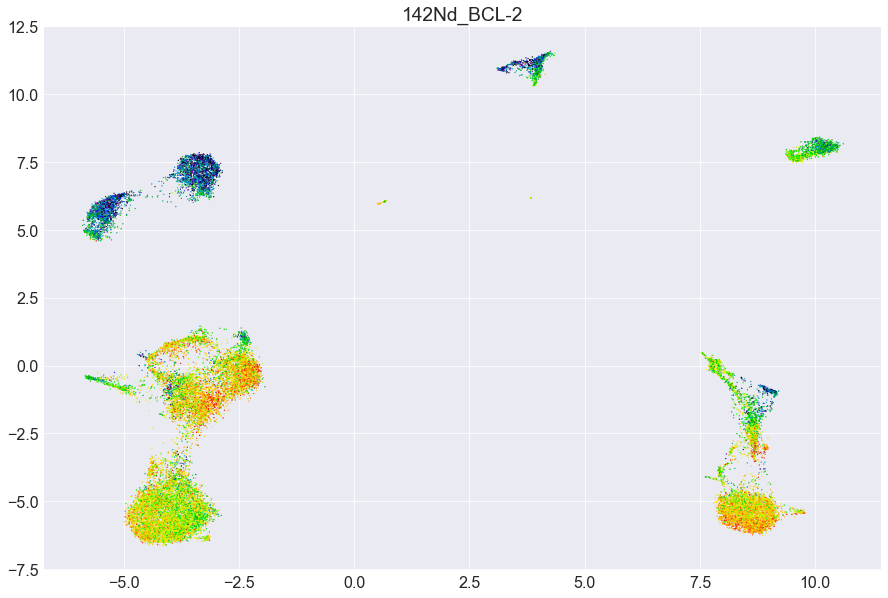

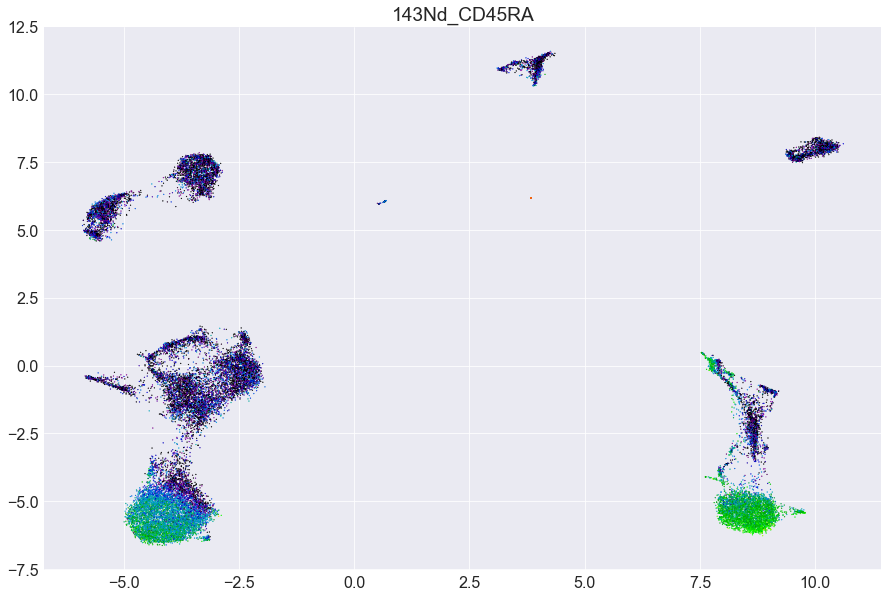

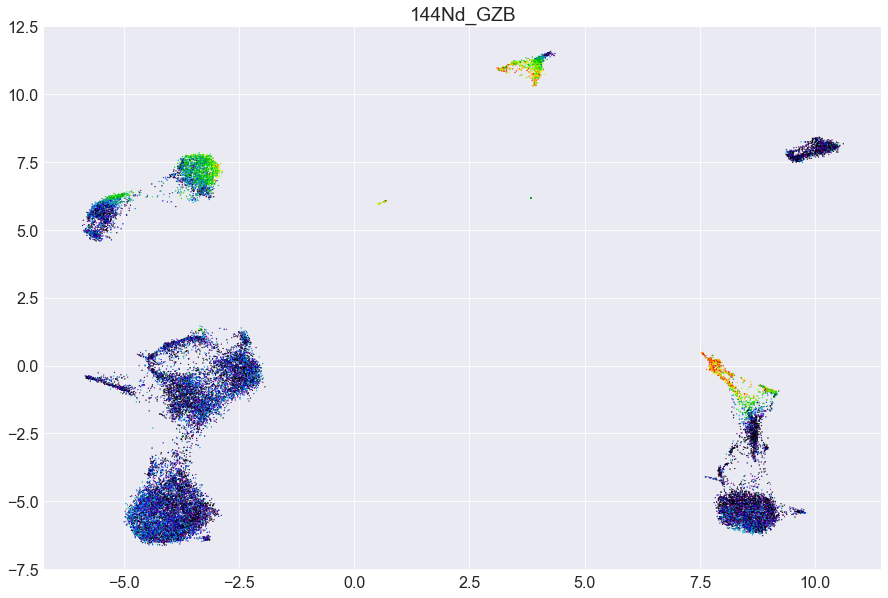

...

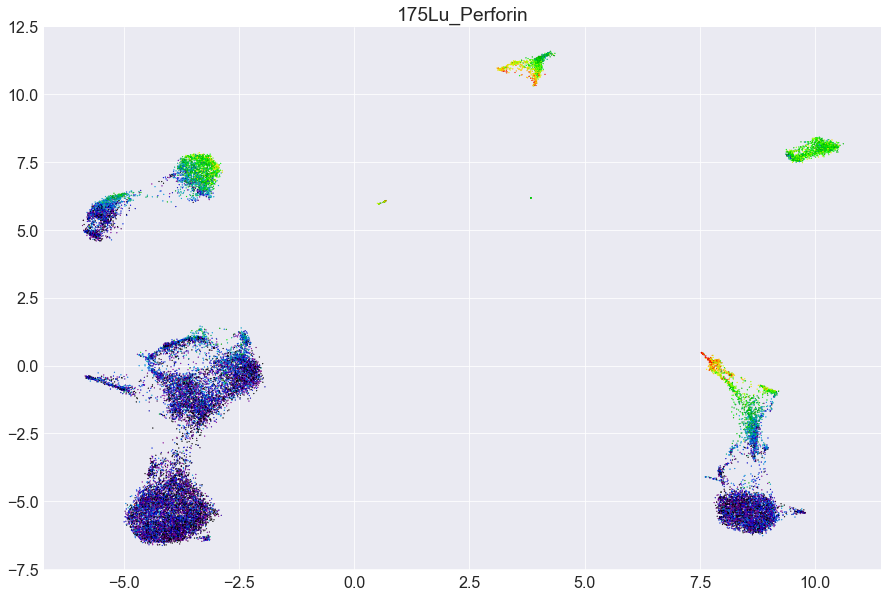

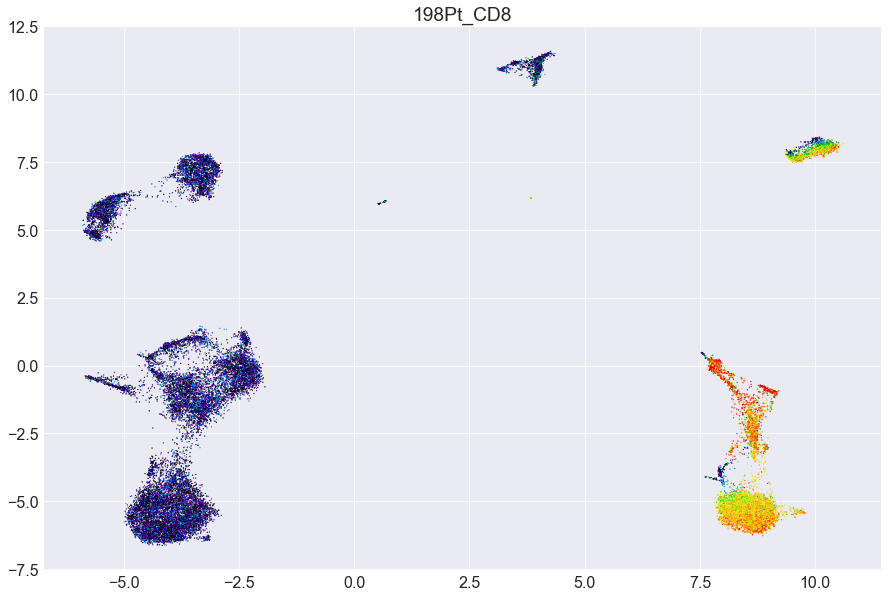

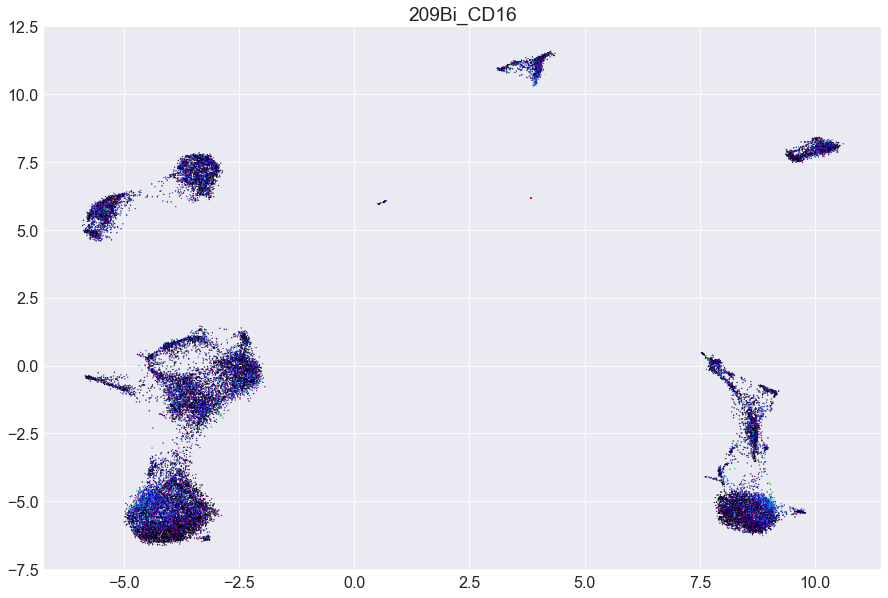

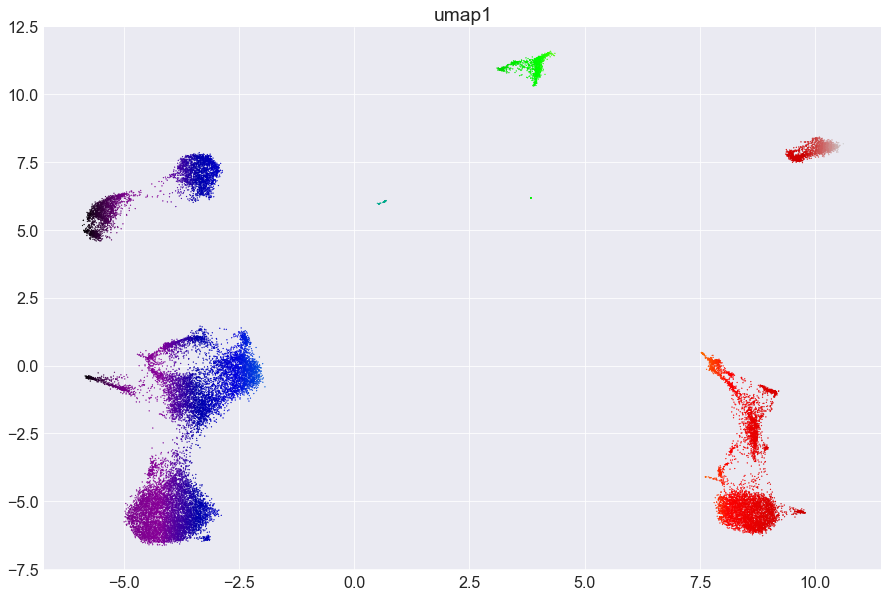

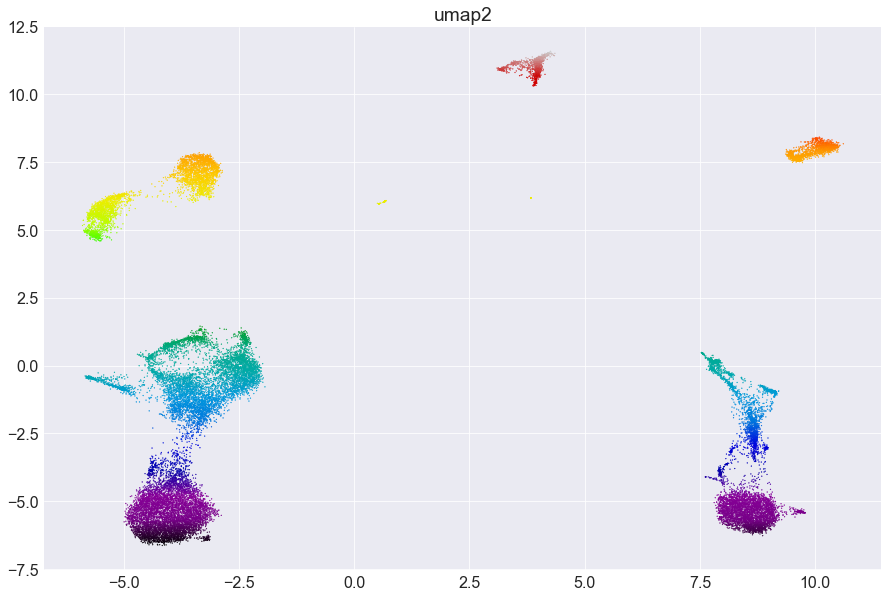

In [43]:
channels=list(cytobank.columns.values)

for n in channels:
    cmap=plt.get_cmap('nipy_spectral')
    fig=plt.figure(figsize=(15,10))
    ax=plt.subplot()
    ax.scatter(cytobank['umap1'], cytobank['umap2'],c=cytobank[n], cmap=cmap, s=1)
    plt.title('{}'.format(n))
    #plt.savefig('{}.pdf'.format(n))
    plt.show()

In [21]:
os.getcwd()

'/Users/s1249052/PhD/flow data/vac69a/t cells only/experiment_210618_files'

In [44]:
cytobank.to_csv('vac69a_03_t+6_umap.csv', sep=',')